<center><h1> Projet : SVM </h1></center>
<center><h1> Prédiction de la qualité du vin</h1></center>

#### Présentation des variables du dataset

 ##### Variables physico-chimiques 
Ces variables décrivent les propriétés chimiques du vin :  
- **fixed_acidity** (*Acidité fixe*) : Quantité d'acides non volatils (comme l'acide tartrique) dans le vin (*g/L*). Influence la fraîcheur et la structure du vin.  
- **volatile_acidity** (*Acidité volatile*) : Quantité d'acides volatils (comme l'acide acétique), qui, en excès, peuvent donner une odeur de vinaigre (*g/L*).  
- **citric_acid** (*Acide citrique*) : Présence d'acide citrique, qui peut donner une sensation de fraîcheur au vin (*g/L*).  
- **residual_sugar** (*Sucre résiduel*) : Quantité de sucre restant après la fermentation (*g/L*). Influence le goût sucré du vin.  
- **chlorides** (*Chlorures*) : Teneur en sel (chlorure de sodium), qui peut impacter la perception du goût (*g/L*).  
- **free_sulfur_dioxide** (*Dioxyde de soufre libre*) : SO₂ non lié, qui joue un rôle dans la protection contre l’oxydation et les bactéries (*mg/L*).  
- **total_sulfur_dioxide** (*Dioxyde de soufre total*) : SO₂ libre + SO₂ combiné avec d'autres composés, utilisé comme conservateur (*mg/L*).  
- **density** (*Densité*) : Rapport entre la masse volumique du vin et celle de l'eau. Dépend de l'alcool, du sucre et d'autres composés (*g/cm³*).  
- **pH** : Niveau d'acidité du vin sur une échelle de 0 à 14. Un vin a généralement un pH entre **2.9 et 3.9**.  
- **sulphates** (*Sulfates*) : Ajoutés comme stabilisants et conservateurs (*g/L*). Un excès peut altérer le goût.  
- **alcohol** (*Alcool*) : Pourcentage d'alcool par volume (%). Facteur clé de la perception du corps et de la chaleur du vin.  

##### Variable cible :
- **quality** (*Qualité*) : Note de qualité du vin, évaluée par des experts, comprise entre **3 et 9** (échelle ordinale).  

#### Importation des libraries

In [1]:
import pandas as pd                
import numpy as np  
import joblib 
import missingno as msno
import kagglehub
import requests
import io
import seaborn as sns

# Data visualization
import matplotlib.pyplot as plt   
import matplotlib.patches as patches
import seaborn as sns              
import plotly.express as px         
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Date
from datetime import datetime

# Statistiques
from scipy.stats import chi2_contingency, pearsonr

# Scikit-Learn
import sklearn
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import plot_tree, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.inspection import permutation_importance
from sklearn.inspection import PartialDependenceDisplay
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import BaggingRegressor, GradientBoostingRegressor, RandomForestRegressor
from sklearn.preprocessing import LabelEncoder 
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Modélisation
from xgboost import XGBRegressor

from lime.lime_tabular import LimeTabularExplainer
import shap

import warnings
warnings.filterwarnings('ignore')

#### Importation du dataset

In [2]:
#Importer le fichier 
data = pd.read_csv('wine_data.csv')

# I. Analyse Exploratoire des données

In [3]:
data.head(5)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,11.6,0.580,0.66,2.20,0.074,10.0,47.0,1.00080,3.25,0.57,9.0,3
1,10.4,0.610,0.49,2.10,0.200,5.0,16.0,0.99940,3.16,0.63,8.4,3
2,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.7,3
3,10.4,0.440,0.42,1.50,0.145,34.0,48.0,0.99832,3.38,0.86,9.9,3
4,8.3,1.020,0.02,3.40,0.084,6.0,11.0,0.99892,3.48,0.49,11.0,3


### 1) Recodage des variables

In [4]:
#Types des variables 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21000 entries, 0 to 20999
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         21000 non-null  float64
 1   volatile_acidity      21000 non-null  float64
 2   citric_acid           21000 non-null  float64
 3   residual_sugar        21000 non-null  float64
 4   chlorides             21000 non-null  float64
 5   free_sulfur_dioxide   21000 non-null  float64
 6   total_sulfur_dioxide  21000 non-null  float64
 7   density               21000 non-null  float64
 8   pH                    21000 non-null  float64
 9   sulphates             21000 non-null  float64
 10  alcohol               21000 non-null  float64
 11  quality               21000 non-null  int64  
dtypes: float64(11), int64(1)
memory usage: 1.9 MB


Nous avons une base de données constituée de 12 variables et 21 000 observations. Les variables ont le bon type.

### 2) Gestion des valeurs manquantes

In [5]:
#Détecter les valeurs manquantes
if data.isnull().values.any():
    print("\nLe DataFrame contient des valeurs manquantes.")
else:
    print("\nAucune valeur manquante dans le DataFrame.")


Aucune valeur manquante dans le DataFrame.


### 3) Statistiques Descriptives

In [6]:
data.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000
mean,9.797079,0.774796,0.793870,31.289348,0.200245,129.442333,229.008762,1.009972,3.158712,1.020641,11.291716,6.000000
std,2.413919,0.365015,0.384833,19.015391,0.124933,77.167262,100.183265,0.012032,0.171371,0.408304,1.182198,2.000048
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,7.600000,0.430000,0.410000,9.800000,0.072000,45.000000,150.000000,0.997417,3.030000,0.620000,10.400000,4.000000
50%,10.000000,0.830000,0.870000,37.600000,0.205000,145.800000,240.500000,1.012200,3.150000,1.080000,11.300000,6.000000
75%,11.800000,1.080000,1.110000,46.800000,0.298000,194.325000,311.625000,1.019840,3.270000,1.360000,12.200000,8.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


L'analyse de la variable quality, représentant la qualité du vin, met en évidence une distribution centrée autour de 6, correspondant à la moyenne et à la médiane de l'échantillon. L'écart-type de 2 indique une dispersion modérée des observations. Ensuite, l'analyse des quartiles révèle que 25 % des vins obtiennent une note inférieure ou égale à 4 et 25 % des vins obtiennent une note supérieure ou égale à 8. Les valeurs minimale (3) et maximale (9) montrent que les notes attribuées couvrent un large éventail, sans présence apparente de valeurs extrêmes

### 4) Représentation graphique

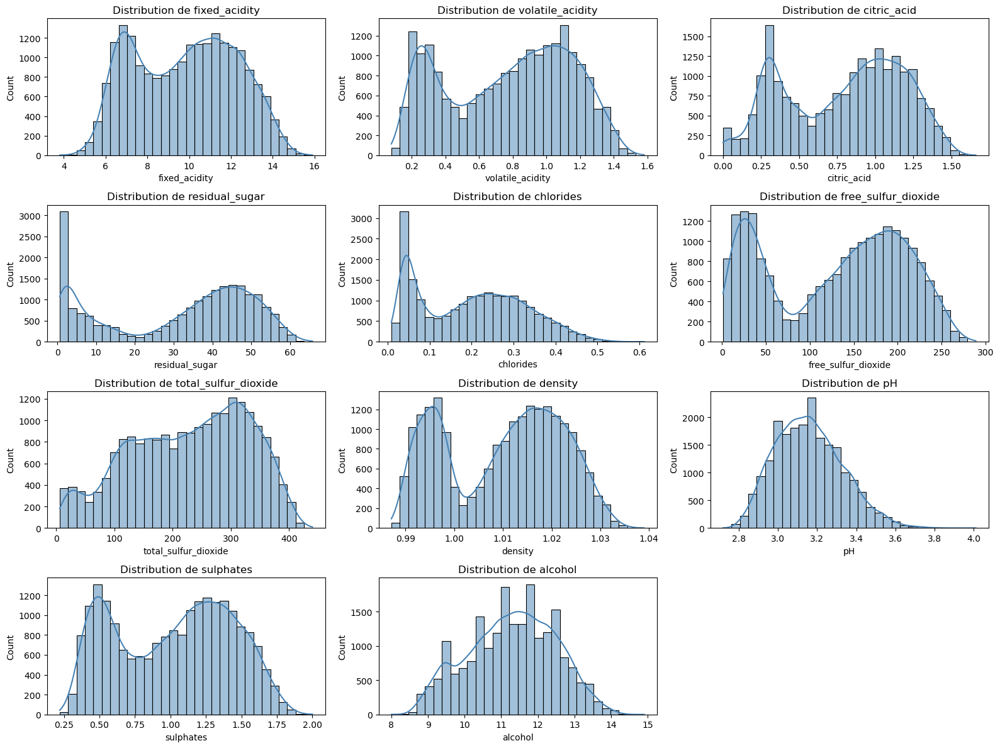

In [7]:
# Identifier les variables numériques continues (float) et la variable quality (integer)
continuous_vars = [col for col in data.columns if data[col].dtype == "float64"]
quality_var = "quality"  # Supposé être la seule variable entière

# 1. Histogrammes pour visualiser la distribution des variables continues
plt.figure(figsize=(16, 12))
for i, col in enumerate(continuous_vars):
    plt.subplot(4, 3, i + 1)  # Organisation en 4 lignes, 3 colonnes
    sns.histplot(data[col], bins=30, kde=True, color="steelblue")
    plt.title(f"Distribution de {col}")

plt.tight_layout()
plt.show()

De nombreuses variables (fixed_acidity, volatile_acidity, citric_acid, residual_sugar, free_sulfur_dioxide, total_sulfur_dioxide, sulphates) montrent une distribution bimodale distincte, suggérant potentiellement deux sous-populations de vins dans le dataset avec des profils chimiques distincts.
Le residual_sugar présente une forte concentration près de 0, puis une distribution plus étalée entre 30 et 60 g/L. 
Les chlorides montrent une distribution similaire avec un pic près de 0. 
Le pH présente une distribution relativement normale, centrée autour de 3.2, typique pour les vins. 

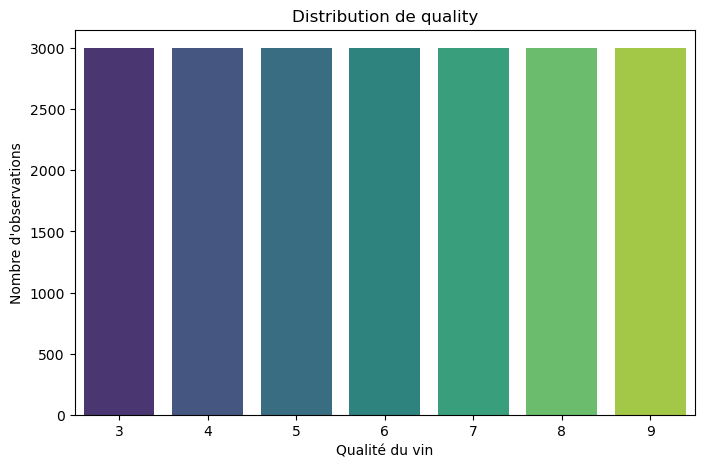

In [8]:
# 2. Histogramme spécifique pour la variable quality
plt.figure(figsize=(8, 5))
sns.countplot(x=data[quality_var], palette="viridis")
plt.title("Distribution de quality")
plt.xlabel("Qualité du vin")
plt.ylabel("Nombre d'observations")
plt.show()

La distribution de la variable quality est équilibrée. Il y a autant d'observations pour chaque modalité de qualité, ce qui signifie que les classes sont bien représentées.

In [9]:
# 3. Boxplots pour détecter les outliers des variables continues

# Normalisation des variables quantitatives
scaler = StandardScaler()

# Sélectionner les colonnes numériques (en excluant celles que vous ne voulez pas)
cols_to_normalize = [col for col in data.columns if data[col].dtype in ['int64', 'float64'] and col not in ['hospital_number', 'lesion_1', 'lesion_2', 'lesion_3']]

# Appliquer la normalisation
data[cols_to_normalize] = scaler.fit_transform(data[cols_to_normalize])

# Création du graphique boxplot
fig = go.Figure()

# Ajouter les boxplots pour chaque colonne normalisée
for col in data.columns:
    if data[col].dtype in ['int64', 'float64'] and col not in ['hospital_number', 'lesion_1', 'lesion_2', 'lesion_3']:
        fig.add_trace(go.Box(y=data[col], name=col, showlegend=False))  # Pas de légende

fig.update_layout(
    title_text="Distribution des variables quantitatives normalisées",
    height=800,
    width=800
)

fig.show()

Nous pouvons remarquer, pour la variable pH de nombreuses outliers, cependant, nous décidons de les conserver car les modèles utilisés par la suite ne sont pas sensibles à ces derniers.

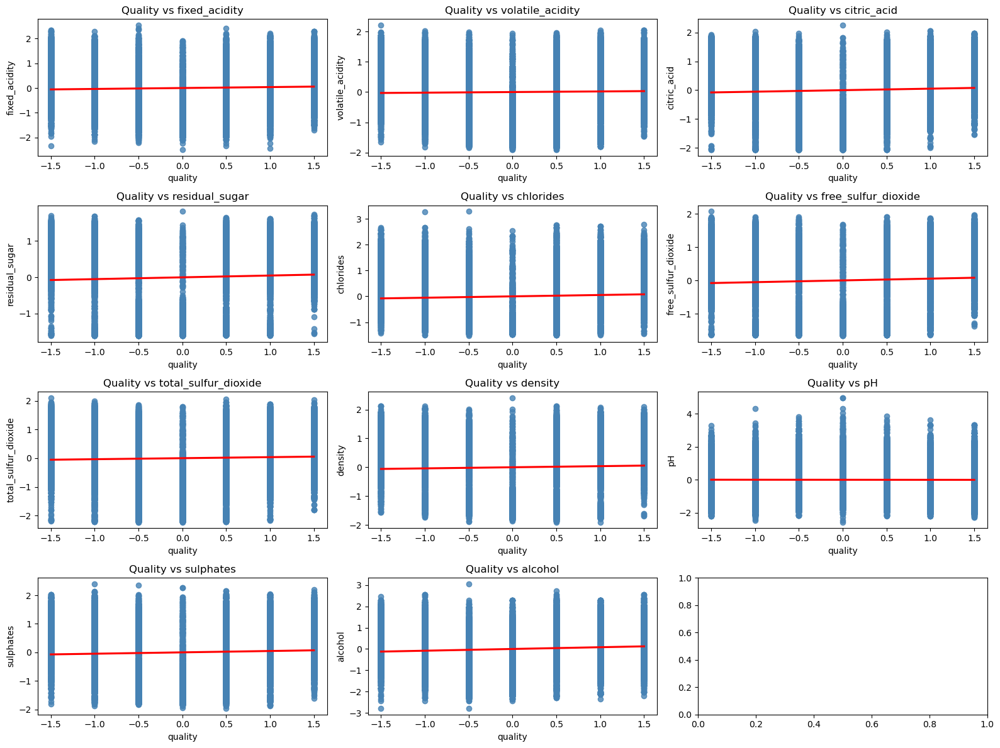

In [10]:
# Créer une grille 4x3 pour afficher les lmplot
fig, axes = plt.subplots(4, 3, figsize=(16, 12))

# Boucle pour afficher chaque lmplot sur une sous-figure
for i, col in enumerate(continuous_vars):
    ax = axes[i // 3, i % 3]  # Choisir le bon axe pour la grille
    sns.regplot(x=quality_var, y=col, data=data, ax=ax, scatter_kws={'color': 'steelblue'}, line_kws={'color': 'red'})
    ax.set_title(f"Quality vs {col}")

# Ajuster l'espacement et afficher les graphiques
plt.tight_layout()
plt.show()


Pour la plupart des variables, la dispersion est très importante (les points sont répartis sur toute la hauteur des graphiques), ce qui indique que ces caractéristiques chimiques individuelles sont insuffisantes pour prédire la qualité du vin. Les données montrent très peu de corrélations fortes entre les paramètres chimiques et la qualité du vin, comme l'indiquent les lignes de tendance presque horizontales. En résumé, cela suggère que la qualité du vin résulte d'interactions complexes entre plusieurs composants plutôt que de l'influence isolée d'un seul paramètre chimique. Cette complexité souligne l'importance d'une approche multivariée dans l'analyse de la qualité du vin. 

### 5) Corrélations

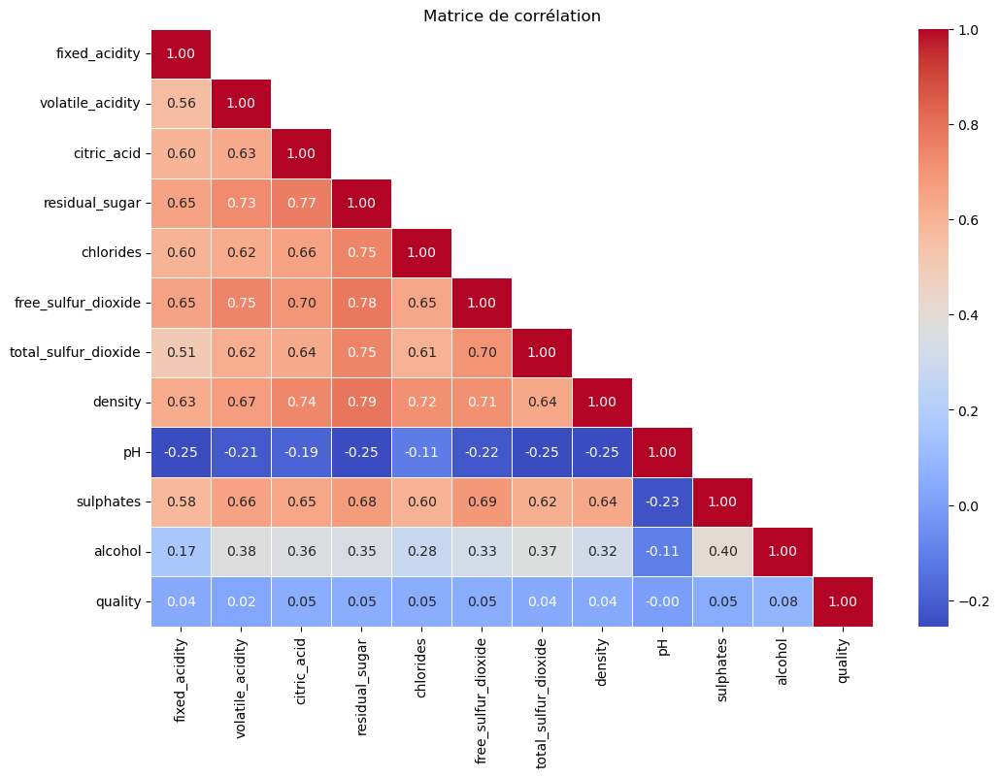

In [11]:
# Calcul de la matrice de corrélation
correlation_matrix = data.corr()

# Masquer la partie supérieure de la matrice de corrélation
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool), k=1)

# Tracer la matrice
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Matrice de corrélation')
plt.show()

Il n'y a pas de multicolinéarité dans notre dataset. Cependant, nous pouvons relever de fortes corrélations entre les certaines variables explicatives notamment avec residual_sugar qui est fortement corrélée avec les variables : density, total_sulfur_dioxide, free_sulfur_dioxide ainsi que chlorides.

Notre target, quant à elle, n'est corrélée avec aucun des X.

### 6) Analyse de classification non supervisée

L'objectif est de comprendre les distributions bimodales des variables et savoir si notre dataset contient 2 types de vins (blanc/rouge ou doux/sec)

In [12]:
# Sélectionner les variables pour le clustering
features = ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 
            'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 
            'density', 'pH', 'sulphates', 'alcohol']

# Préparation des données
X = data[features]

# Standardisation des données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Déterminer le nombre optimal de clusters avec la méthode du coude
inertia = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, kmeans.labels_))


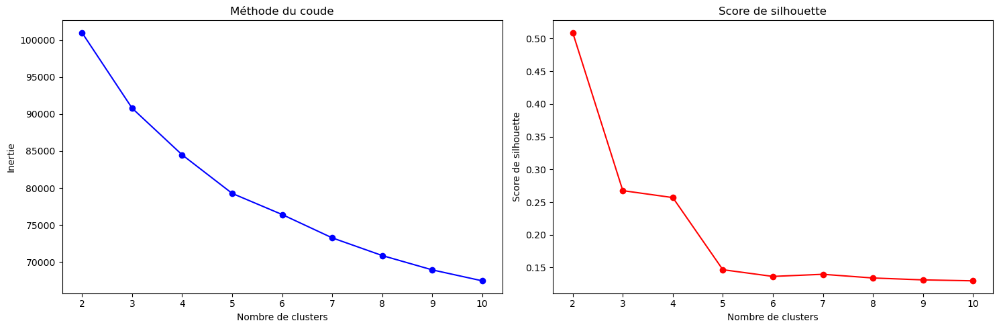

In [13]:
# Visualiser le graphique du coude et le score de silhouette
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(K_range, inertia, 'bo-')
ax1.set_xlabel('Nombre de clusters')
ax1.set_ylabel('Inertie')
ax1.set_title('Méthode du coude')

ax2.plot(K_range, silhouette_scores, 'ro-')
ax2.set_xlabel('Nombre de clusters')
ax2.set_ylabel('Score de silhouette')
ax2.set_title('Score de silhouette')

plt.tight_layout()
plt.show()

La courbe de la méthode du coude montre une diminution progressive de l'inertie sans point d'inflexion clair. Toutefois, la baisse est plus prononcée jusqu'à k=4 puis devient plus graduelle.
La courbe du score de silhouette montre que le score est nettement supérieur pour k=2 (environ 0.51), puis chute significativement pour k=3 et au-delà. Cette métrique indique clairement que la division en 2 clusters est optimale pour ce jeu de données.

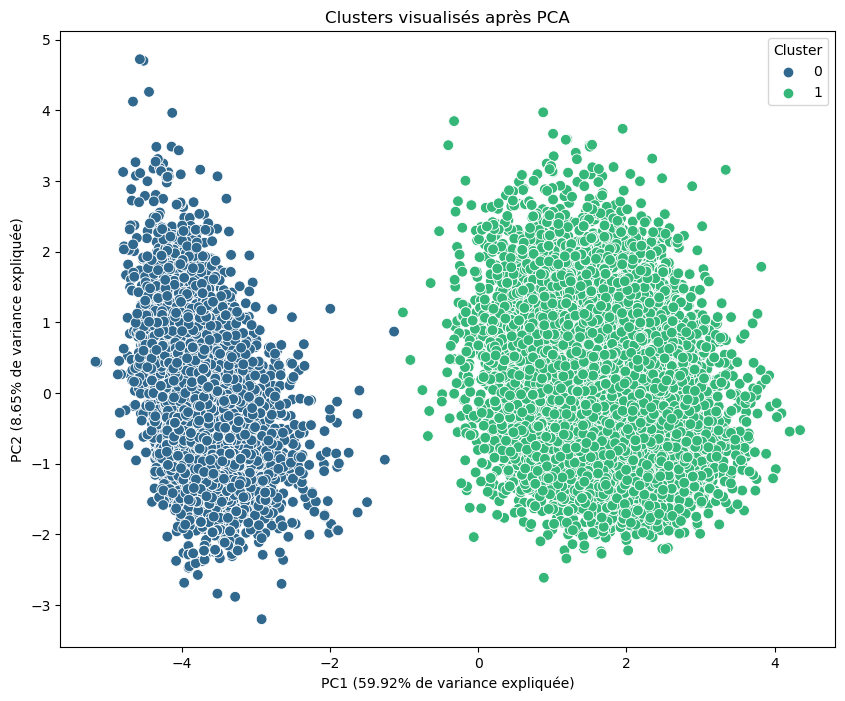

In [14]:
# Basé sur les résultats, nous choisissons un nombre de clusters
# Pour cet exemple, supposons que k=2 soit optimal
k_optimal = 2  

# Appliquer KMeans avec le nombre optimal de clusters
kmeans = KMeans(n_clusters=k_optimal, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X_scaled)

# Ajouter les labels de cluster au dataframe
data['cluster'] = cluster_labels

# Réduire la dimensionnalité avec PCA pour visualisation
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['cluster'] = cluster_labels

# Visualiser les clusters avec PCA
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=pca_df, palette='viridis', s=60)
plt.title('Clusters visualisés après PCA')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} de variance expliquée)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} de variance expliquée)')
plt.legend(title='Cluster')
plt.show()

La PCA a réussi à séparer les données en deux groupes très distincts et sans chevauchement.
Les deux premières composantes principales captent ensemble environ 68.6% de la variance totale (PC1: 59.9%, PC2: 8.7%).
Cette séparation nette confirme la présence de deux sous-populations bien distinctes dans le dataset, validant le choix de k=2 clusters.

Caractéristiques moyennes par cluster:
         fixed_acidity  volatile_acidity  citric_acid  residual_sugar  \
cluster                                                                 
0            -1.069630         -1.192440    -1.235260       -1.359564   
1             0.479062          0.534066     0.553244        0.608917   

         chlorides  free_sulfur_dioxide  total_sulfur_dioxide   density  \
cluster                                                                   
0        -1.154797            -1.281719             -1.130711 -1.269969   
1         0.517206             0.574052              0.506419  0.568789   

               pH  sulphates   alcohol  
cluster                                 
0        0.349261  -1.198862 -0.676598  
1       -0.156426   0.536942  0.303033  


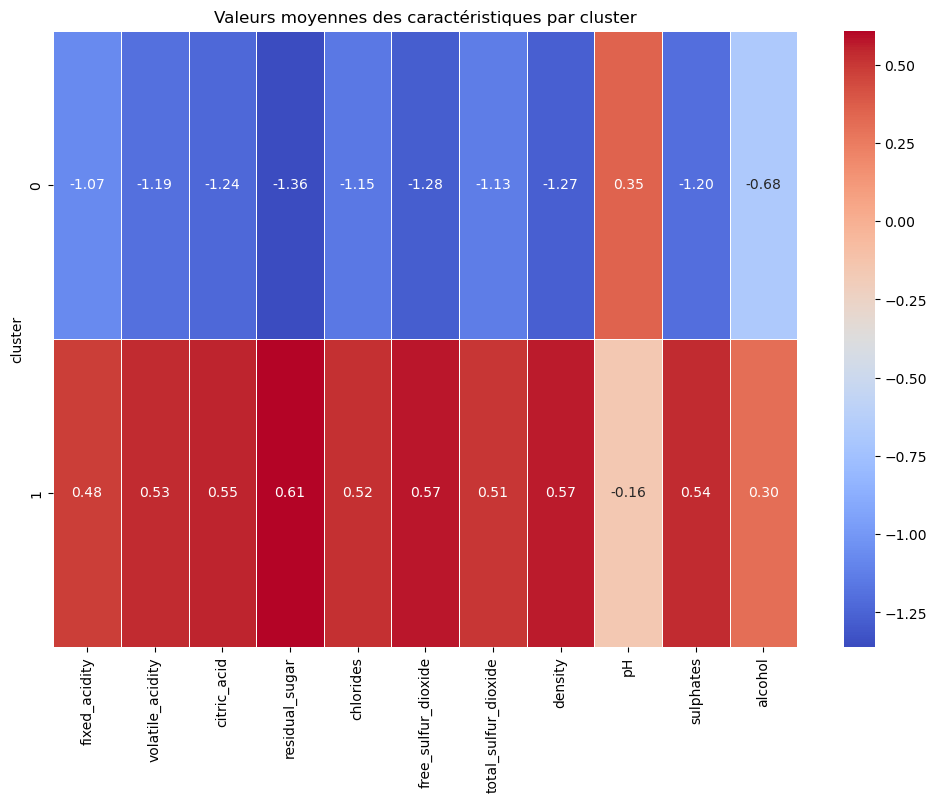

In [15]:
# Analyser les caractéristiques de chaque cluster
cluster_means = data.groupby('cluster')[features].mean()
print("Caractéristiques moyennes par cluster:")
print(cluster_means)

# Heatmap des moyennes de variables par cluster
plt.figure(figsize=(12, 8))
sns.heatmap(cluster_means, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Valeurs moyennes des caractéristiques par cluster')
plt.show()

Les deux clusters présentent des profils chimiques nettement distincts. Le premier cluster affiche des valeurs négatives pour la plupart des variables, sauf le pH, ce qui suggère des vins moins acides, moins sucrés et moins concentrés en composés soufrés. Ce profil pourrait correspondre à des vins rouges secs, souvent caractérisés par une acidité plus modérée et une utilisation plus limitée du soufre.

À l’inverse, le second cluster montre des valeurs positives pour la majorité des paramètres, traduisant des vins plus acides, plus sucrés et plus riches en soufre, ce qui évoque plutôt des vins blancs moelleux ou liquoreux. Le pH, seule variable à tendance inversée (positif dans le cluster 1, négatif dans le cluster 2), renforce cette distinction : plus élevé dans les rouges secs, plus bas dans les blancs doux.

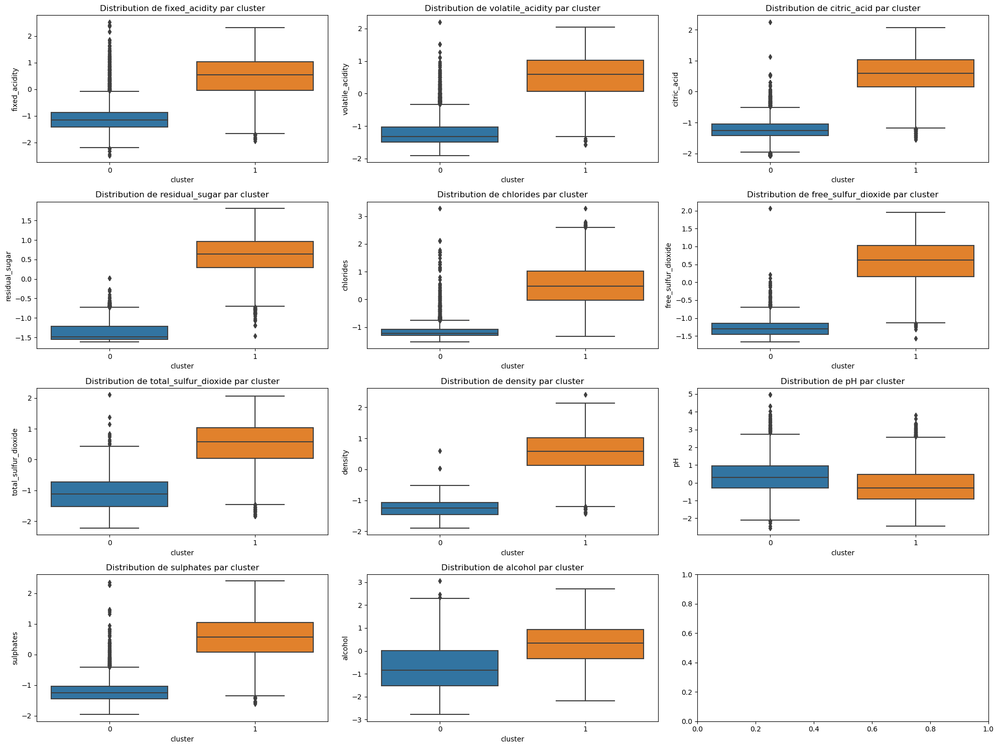

In [16]:
# Visualiser la distribution des variables par cluster
fig, axes = plt.subplots(4, 3, figsize=(20, 15))
axes = axes.flatten()

for i, feature in enumerate(features):
    if i < len(axes):
        sns.boxplot(x='cluster', y=feature, data=data, ax=axes[i])
        axes[i].set_title(f'Distribution de {feature} par cluster')

plt.tight_layout()
plt.show()

Les boxplots confirment la séparation claire entre les deux clusters pour presque toutes les variables.
Les différences sont particulièrement prononcées pour l'acidité fixe, l'acidité volatile, l'acide citrique, le sucre résiduel et la densité.
Le pH montre une séparation moins nette entre les clusters mais reste discriminant.

Les résultats mettent en évidence 2 types de vins dans le dataset. Cette information pourrait améliorer significativement les modèles de prédiction de qualité en traitant chaque type séparément.

# II. Modélisation

#### Séparer la base en 2 jeux de données

In [17]:
X = data.drop('quality', axis=1)
y = data['quality']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=77)

In [18]:
print(f"Dimensions de X_train: {X_train.shape}")
print(f"Dimensions de X_test: {X_test.shape}")
print(f"Dimensions de y_train: {y_train.shape}")
print(f"Dimensions de y_test: {y_test.shape}")

Dimensions de X_train: (16800, 12)
Dimensions de X_test: (4200, 12)
Dimensions de y_train: (16800,)
Dimensions de y_test: (4200,)


### Modèle Linéaire

In [19]:
linear_model = LinearRegression()

#Entraîner le modèle sur les données d'entraînement
linear_model.fit(X_train, y_train)

# Prédire les valeurs sur l'ensemble de test
y_pred_linear = linear_model.predict(X_test)

#Calculer les performances du modèle
mse_linear = mean_squared_error(y_test, y_pred_linear)
r2_linear = r2_score(y_test, y_pred_linear)

print("Régression Linéaire")
print(f"Mean Squared Error (MSE): {mse_linear}")
print(f"R-squared (R2): {r2_linear}")

Régression Linéaire
Mean Squared Error (MSE): 0.9812775108249835
R-squared (R2): 0.008968072026810936


### Random Forest

In [20]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=77)

rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print("Random Forest")
print(f"Mean Squared Error (MSE): {mse_rf}")
print(f"R-squared (R2): {r2_rf}")

Random Forest
Mean Squared Error (MSE): 0.5098244464285714
R-squared (R2): 0.48510762908731775


### Support Vector Machine

In [21]:
svr_model = SVR(kernel='rbf', C=100, gamma=0.1)
svr_model.fit(X_train, y_train)

y_pred_svr = svr_model.predict(X_test)

mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

print("Support Vector Regression")
print(f"Mean Squared Error (MSE): {mse_svr}")
print(f"R-squared (R2): {r2_svr}")

Support Vector Regression
Mean Squared Error (MSE): 1.0974581453938217
R-squared (R2): -0.10836745946122295


### xgboost

In [22]:
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=77)
xgb_model.fit(X_train, y_train)

y_pred_xgb = xgb_model.predict(X_test)

mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print("XGBoost")
print(f"Mean Squared Error (MSE): {mse_xgb}")
print(f"R-squared (R2): {r2_xgb}")

XGBoost
Mean Squared Error (MSE): 0.8819572005544539
R-squared (R2): 0.10927567868086152


### Gradient Boosting Regressor

In [23]:
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=77)
gbr_model.fit(X_train, y_train)

y_pred_gbr = gbr_model.predict(X_test)

mse_gbr = mean_squared_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)

print("Gradient Boosting Regressor")
print(f"Mean Squared Error (MSE): {mse_gbr}")
print(f"R-squared (R2): {r2_gbr}")

Gradient Boosting Regressor
Mean Squared Error (MSE): 0.9440729022062002
R-squared (R2): 0.046542514121139966


### Bagging Regressor

In [24]:
bagging_model = BaggingRegressor(n_estimators=100, random_state=77)

bagging_model.fit(X_train, y_train)

y_pred_bagging = bagging_model.predict(X_test)

mse_bagging = mean_squared_error(y_test, y_pred_bagging)
r2_bagging = r2_score(y_test, y_pred_bagging)

print("Bagging Regressor")
print(f"Mean Squared Error (MSE): {mse_bagging}")
print(f"R-squared (R2): {r2_bagging}")

Bagging Regressor
Mean Squared Error (MSE): 0.5107612678571429
R-squared (R2): 0.48416149515855456


### K-Nearest Neighbors (KNN)

In [25]:
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train, y_train)

y_pred_knn = knn_model.predict(X_test)

mse_knn = mean_squared_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print("K-Nearest Neighbors Regression")
print(f"Mean Squared Error (MSE): {mse_knn}")
print(f"R-squared (R2): {r2_knn}")

K-Nearest Neighbors Regression
Mean Squared Error (MSE): 0.9645690476190476
R-squared (R2): 0.025842626188891327


### Neural Network (MLP Regressor)

In [26]:
mlp_model = MLPRegressor(hidden_layer_sizes=(100,50), activation='relu', solver='adam', max_iter=500, random_state=77)
mlp_model.fit(X_train, y_train)

y_pred_mlp = mlp_model.predict(X_test)

mse_mlp = mean_squared_error(y_test, y_pred_mlp)
r2_mlp = r2_score(y_test, y_pred_mlp)

print("MLP Regressor (Neural Network)")
print(f"Mean Squared Error (MSE): {mse_mlp}")
print(f"R-squared (R2): {r2_mlp}")

MLP Regressor (Neural Network)
Mean Squared Error (MSE): 0.9819971051846649
R-squared (R2): 0.008241324518826088


## Comparaison des modèles

In [27]:
models_scores = {
    "Linear Regression": r2_linear,
    "Random Forest": r2_rf,
    "SVR": r2_svr,
    "XGBoost": r2_xgb,
    "Gradient Boosting": r2_gbr,
    "KNN": r2_knn,
    "MLP Regressor": r2_mlp,
    "Bagging": r2_bagging
}

for model, score in sorted(models_scores.items(), key=lambda x: x[1], reverse=True):
    print(f"{model}: R² = {score:.4f}")

Random Forest: R² = 0.4851
Bagging: R² = 0.4842
XGBoost: R² = 0.1093
Gradient Boosting: R² = 0.0465
KNN: R² = 0.0258
Linear Regression: R² = 0.0090
MLP Regressor: R² = 0.0082
SVR: R² = -0.1084


Le meilleur modèle selon le R² est le Random Forest ainsi nous allons le tuner.

# III. Tunage du meilleur modèle, Random Forest

In [28]:
rf = RandomForestRegressor(random_state=77)

#Définir la grille des hyperparamètres à tester
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

#Configurer la recherche par grille
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

#Appliquer la recherche par grille pour trouver les meilleurs paramètres
grid_search.fit(X_train, y_train)

print("Meilleurs paramètres : ", grid_search.best_params_)

best_rf = grid_search.best_estimator_

y_pred = best_rf.predict(X_test)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Meilleurs paramètres :  {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


In [29]:
#Utiliser les meilleurs paramètres trouvés
best_rf = RandomForestRegressor(
    max_depth=None,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=300,
    random_state=77
)

#Entraîner le modèle avec les meilleurs paramètres sur les données d'entraînement
best_rf.fit(X_train, y_train)

y_pred = best_rf.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R2 Score: {r2}")

Mean Squared Error: 0.4986109755291006
R2 Score: 0.49643256781482503


Ces résultats montrent que le modèle Random Forest améliore légèrement ses performances après l'optimisation des hyperparamètres. Le MSE diminue de 0,510 à 0,499, tandis que le coefficient R2 augmente de 0,485 à 0,496.

### Contribution des variables à la prévision de la qualité du vin

                 Feature  Importance
7                density    0.101242
6   total_sulfur_dioxide    0.099344
5    free_sulfur_dioxide    0.099024
3         residual_sugar    0.094833
4              chlorides    0.092929
2            citric_acid    0.088562
1       volatile_acidity    0.087986
9              sulphates    0.087498
0          fixed_acidity    0.083585
10               alcohol    0.082317


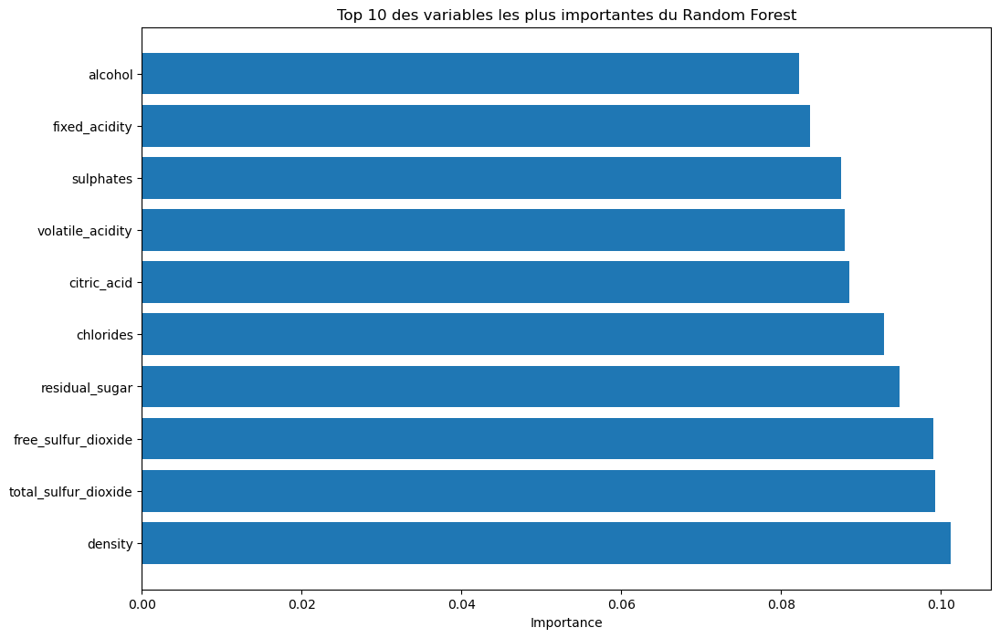

In [30]:
#Récupérer l'importance des caractéristiques
importances = best_rf.feature_importances_

#Créer un DataFrame avec les noms des features et leur importance
feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': importances
})

#Trier par ordre d'importance décroissante
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

top_10_features = feature_importance_df.head(10)
print(top_10_features)

plt.figure(figsize=(12, 8))
plt.barh(top_10_features['Feature'], top_10_features['Importance'])
plt.xlabel('Importance')
plt.title('Top 10 des variables les plus importantes du Random Forest')
plt.show()

Les variables les plus importantes dans le modèle sont density (rapport entre la masse volumique du vin et celle de l'eau), total_sulfur_dioxide (conservateur) et free_sulfur_dioxide (protection contre l’oxydation et les bactéries), avec des importances respectives de 0.101242, 0.099344 et 0.099024. Ces trois caractéristiques ont une  influence sur la prédiction de la qualité du vin.

D'autres variables comme residual_sugar (quantité de sucre restant après la fermentation) ou encore chlorides (teneur en sel) ont également une importante dans la prédicition de la qualité du vin.

### Graphiques de dépendance partielle (PDP) des variables clés

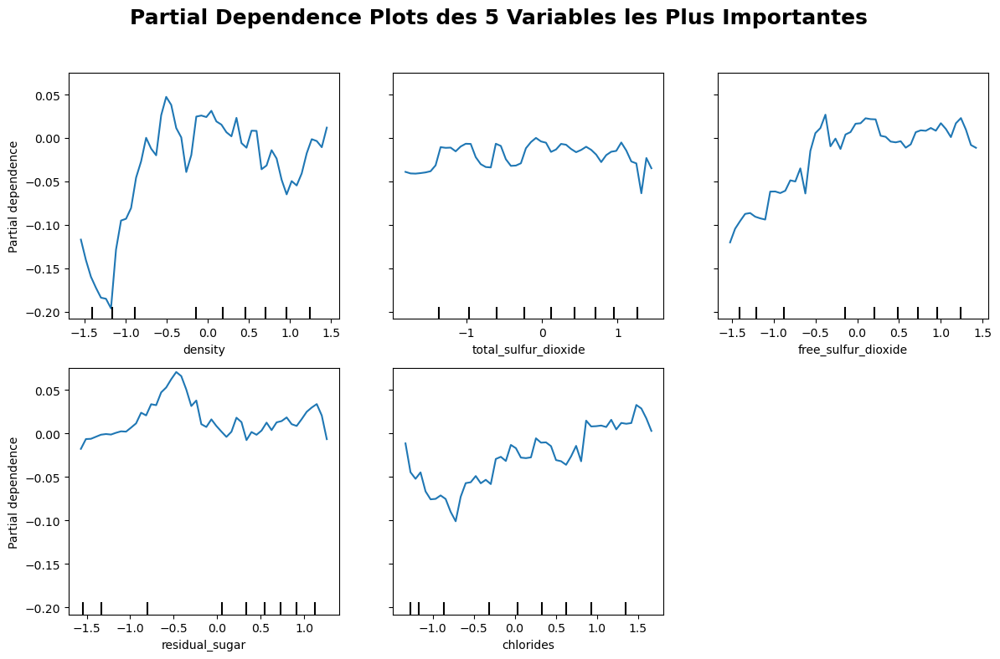

In [31]:
#Sélectionner les 5 features les plus importantes
top_features = feature_importance_df.head(5)['Feature'].tolist()

#Tracer les PDP pour les 5 features les plus importantes
fig, ax = plt.subplots(figsize=(12, 8))

display = PartialDependenceDisplay.from_estimator(
    best_rf,                        
    X_train,                        
    features=top_features,         
    grid_resolution=50,            
    ax=ax
)

fig.suptitle("Partial Dependence Plots des 5 Variables les Plus Importantes", fontsize=18, weight='bold')
fig.tight_layout(rect=[0, 0, 1, 0.95])  # Ajuster l'espacement pour éviter les chevauchements
plt.show()

Les Partial Dependence Plots permettent de comprendre l'impact des cinq variables les plus importantes sur la prédiction de la qualité du vin par le modèle. Ces graphiques montrent comment la valeur prédite varie en fonction d'une variable donnée, toutes les autres étant maintenues constantes. Cette approche permet d’interpréter globalement le comportement du modèle et d’identifier les tendances influençant la qualité du vin.

Tout d'abord, la density joue un rôle significatif dans l’évaluation du vin. Nous observons qu’une faible densité est associée à une baisse de la qualité, tandis qu’une densité modérée semble améliorer la note du vin avant de se stabiliser. Cela peut s’expliquer par le fait qu’un vin trop dilué ou trop concentré peut nuire à son goût. Cependant, la densité peut être naturellement plus élevée dans certains vins moelleux en raison de leur teneur en sucre, ce qui pourrait fausser l’interprétation si le modèle ne distingue pas le type de vin.

De même, le free_sulfur_dioxide semble influencer positivement la qualité du vin jusqu’à un certain seuil, après quoi l’effet se stabilise. Ce composé est utilisé comme conservateur : un bon dosage pourrait contribuer à la préservation des arômes et de la fraîcheur du vin, particulièrement dans les vins blancs, qui sont généralement plus sensibles à l’oxydation. À l’inverse, les vins rouges nécessitent souvent moins de dioxyde de soufre libre, ce qui peut entraîner une interprétation différente pour cette variable selon le type.

L’effet du total_sulfur_dioxide, quant à lui, reste relativement faible, suggérant qu’il n’a pas une influence déterminante sur la note finale attribuée aux vins, bien qu’il puisse contribuer à la stabilité du vin à long terme.

Le residual_sugar présente une légère corrélation positive avec la qualité, ce qui pourrait indiquer que des vins légèrement sucrés sont mieux appréciés. Toutefois, ce lien dépend étroitement du type de vin : dans un vin moelleux, un taux élevé de sucre est attendu et apprécié, tandis que dans un vin sec (blanc ou rouge), un excès de sucre est souvent perçu négativement. Cela renforce l'idée qu'une segmentation selon le type de vin permettrait une analyse plus fine.

Enfin, les chlorides ont un impact négatif marqué sur la qualité du vin. Une teneur élevée en sel ou en minéraux pourrait altérer le goût et donner une sensation désagréable. Là encore, les seuils de tolérance peuvent varier légèrement selon le style du vin, mais la tendance générale reste défavorable.

### Importance des caractéristiques par permutation dans la prédiction de la qualité du vin

                 Feature  Importance  Importance_std
7                density    0.211584        0.003500
4              chlorides    0.190855        0.002822
5    free_sulfur_dioxide    0.180243        0.002466
9              sulphates    0.162036        0.003346
3         residual_sugar    0.161207        0.002359
1       volatile_acidity    0.156402        0.003539
10               alcohol    0.147257        0.002127
6   total_sulfur_dioxide    0.145264        0.002067
2            citric_acid    0.140367        0.002576
8                     pH    0.120753        0.001696
0          fixed_acidity    0.118057        0.002059
11               cluster    0.005240        0.000155


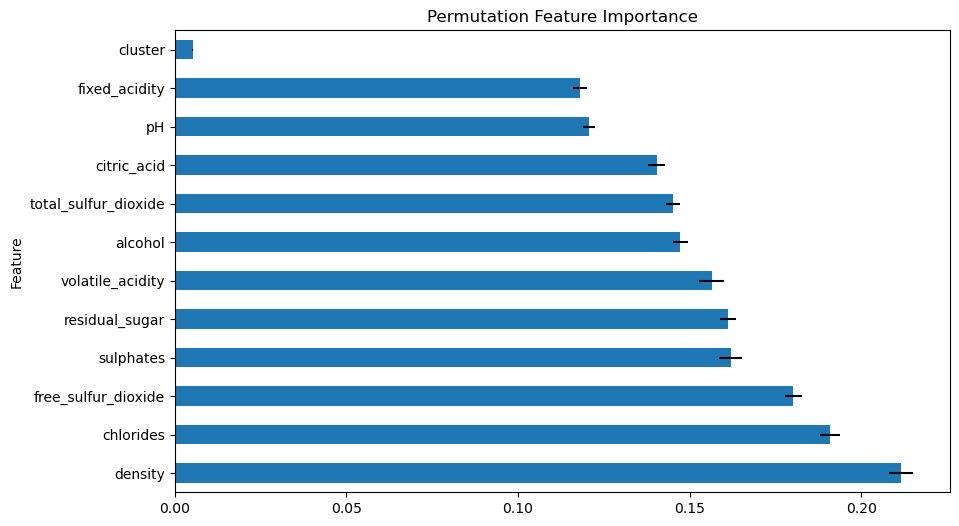

In [32]:
#Calculer l'importance des caractéristiques par permutation
result = permutation_importance(best_rf, X_test, y_test, n_repeats=10, random_state=77)

#Afficher l'importance des caractéristiques
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': result.importances_mean,
    'Importance_std': result.importances_std
})

#Trier les features par importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)

importance_df.plot(kind='barh', x='Feature', y='Importance', xerr='Importance_std', legend=False, figsize=(10, 6))
plt.title('Permutation Feature Importance')
plt.show()

Les résultats de l’analyse d’importance des variables par permutation mettent en évidence les facteurs clés influençant la qualité du vin. La density apparaît comme la variable la plus déterminante, ce qui suggère qu’elle joue un rôle essentiel dans les propriétés physiques et sensorielles du vin. Cette variable peut notamment refléter des différences structurelles selon le type de vin : les vins moelleux ont naturellement une densité plus élevée en raison de leur teneur en sucre, tandis que les rouges et blancs secs présentent une densité plus faible. Le fait que cette variable soit si influente pourrait donc refléter des effets liés à la typologie du vin que le modèle pourrait confondre avec des différences de qualité.

Les chlorides et le free_sulfur_dioxide suivent de près, indiquant l’influence de la composition chimique sur la perception du goût et la conservation. Encore une fois, ces effets peuvent être amplifiés ou atténués selon le type de vin : les vins blancs nécessitent souvent plus de soufre pour éviter l’oxydation, tandis que les rouges en requièrent moins. L’importance élevée de ces variables souligne le rôle central des ajustements chimiques dans la vinification.

D’autres variables comme le residual_sugar, les sulphates et l’alcohol contribuent également à la prédiction, bien que leur impact soit légèrement moindre. L’alcool, par exemple, peut être un facteur de qualité perçue dans certains vins rouges puissants, mais son excès peut déséquilibrer un vin blanc sec ou un moelleux, montrant là encore que son influence dépend du style du vin.

En revanche, des caractéristiques comme le pH et l’acidity_fixed ont une importance relativement faible, ce qui laisse penser qu’elles influencent moins directement la qualité globale perçue du vin, ou bien que leur effet est subtilement intégré par d’autres variables. Enfin, la variable cluster, avec une importance négligeable, ne semble pas apporter d’informations pertinentes au modèle, ce qui suggère que la segmentation automatique réalisée n’apporte pas de gain en termes de prédiction.

Ces résultats confirment que la qualité du vin dépend d’un équilibre subtil entre ses différentes composantes chimiques et physiques, mais aussi que cet équilibre peut varier sensiblement d’un type de vin à un autre. Intégrer cette dimension dans le modèle (via une variable catégorielle ou des modèles spécialisés par type de vin) permettrait d’améliorer l’interprétation et la précision des prédictions.

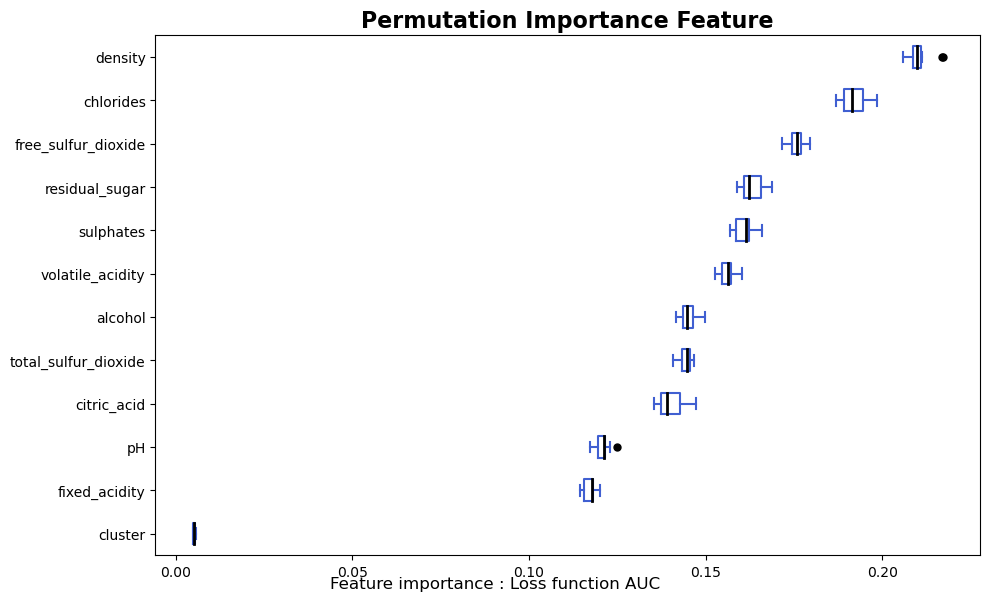

In [33]:
#Calculer l'importance des caractéristiques par permutation
resultat = permutation_importance(best_rf, X_test, y_test, n_repeats=10, random_state=42)

#Trier les features par importance (en ordre croissant)
sortie = resultat.importances_mean.argsort()

#Personnaliser uniquement le contour du boxplot
boxprops = dict(color="#405fd1", linewidth=1.5)
whiskerprops = dict(color="#405fd1", linewidth=1.5)
capprops = dict(color="#405fd1", linewidth=1.5)

fig, ax1 = plt.subplots(1, 1, figsize=(10, 6))

ax1.boxplot(
    resultat.importances[sortie].T,
    vert=False,
    labels=X_train.columns[sortie],
    boxprops=boxprops,
    whiskerprops=whiskerprops,
    capprops=capprops,
    medianprops=dict(color="black", linewidth=2),  #Médiane en noir
    flierprops=dict(marker="o", markerfacecolor="black", markersize=5, linestyle="none"),  #Points aberrants en noir
)

plt.title("Permutation Importance Feature", fontsize=16, weight="bold", color="black")
fig.text(
    0.5, 
    0.01, 
    "Feature importance : Loss function AUC", 
    ha="center", 
    fontsize=12, 
    color="black"
)
fig.tight_layout()

plt.show()

Ce graphique représente l'importance des variables par permutation, une méthode permettant d’évaluer l'impact de chaque variable sur la performance du modèle. L’idée est de mesurer la diminution de la performance (ici via la fonction de perte AUC) lorsque les valeurs d’une variable sont aléatoirement permutées, rompant ainsi leur relation avec la cible. Plus l’impact est fort, plus la variable est importante.

Nous observons ici que la density est la variable la plus influente dans la prédiction de la qualité du vin, suivie des chlorides et du free_sulfur_dioxide. Cela confirme les résultats obtenus avec les PDP, où la densité et la teneur en chlorures montraient un effet marqué sur la qualité du vin. Une densité élevée pourrait être associée à des vins plus concentrés et structurés, ce qui est souvent le cas des vins moelleux, tandis qu’une densité trop faible pourrait indiquer un manque de corps ou de richesse, potentiellement moins apprécié. De même, les chlorures peuvent refléter la salinité du vin, qui peut altérer ses qualités gustatives : un excès est généralement perçu plus négativement dans les blancs secs et moelleux que dans certains rouges plus robustes.

Le free_sulfur_dioxide joue un rôle important dans la protection du vin contre l’oxydation, et son effet sur la qualité peut varier selon les types de vin : les vins blancs sont plus sensibles à l’oxydation, ce qui explique pourquoi ce paramètre est crucial pour eux. Cette importance pourrait donc être partiellement due à la composition majoritaire des données (si le jeu contient plus de blancs que de rouges, par exemple).

Les variables comme le pH et l’acidity_fixed ont une importance relativement plus faible, ce qui suggère que leur impact direct sur la prédiction de la qualité est limité dans ce modèle. L’alcohol et l’acidity_volatile, bien que présents parmi les variables importantes, ont un effet intermédiaire. À noter que l’alcool peut être un indicateur de richesse aromatique ou de puissance, apprécié dans les rouges, mais pouvant déséquilibrer un vin blanc s’il est trop élevé.

Enfin, la variable cluster semble avoir une influence négligeable, ce qui indique qu’elle n’apporte pas d’informations significatives pour améliorer les prédictions du modèle. Cela pourrait signifier que la segmentation réalisée ne reflète pas suffisamment la diversité sensorielle ou chimique entre les types de vins analysés.

### Réaliser une explicabilité par individu sur le modèle RF
- 1) ICE, le PDP est-il une bonne représentation des variables importantes de votre modèle?
- 2) LIME
- 3) SHAP watterfall plot

> #### 1. ICE

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

display = PartialDependenceDisplay.from_estimator(
    best_rf,
    X=X_train,
    features=top_features,
    kind="individual",  # Spécifier ICE
    grid_resolution=50,
    ax=ax
)

plt.suptitle("Individual Conditional Expectation (ICE) Plots", fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

Les ICE plots affichés montrent l'effet individuel des variables density, total_sulfur_dioxide, free_sulfur_dioxide, residual_sugar et chlorides sur les prédictions du modèle en maintenant les autres variables constantes.

Globalement, les courbes sont denses et dispersées, suggérant que ces variables ont un effet limité sur la prédiction globale, mais qu'elles peuvent influencer certaines observations de manière plus marquée. La plupart des courbes sont horizontales, indiquant une absence de tendance claire, ce qui suggère que l'impact global est faible. Cependant, certaines courbes présentent des variations plus importantes, notamment pour total_sulfur_dioxide et free_sulfur_dioxide, ce qui pourrait indiquer une interaction avec d'autres variables. De même, residual_sugar et chlorides montrent un effet non linéaire pour certaines observations, ce qui suggère la présence de seuils critiques.

Il est également possible que ces effets varient en fonction du type de vin (blanc vs rouge) ou de son style (sec vs moelleux). Par exemple, l'impact du total_sulfur_dioxide pourrait être plus prononcé pour les vins blancs, où la présence de soufre joue un rôle plus important dans la conservation et les caractéristiques organoleptiques. De même, pour les vins moelleux, la courbe de residual_sugar pourrait afficher un effet plus marqué, indiquant que la quantité de sucre résiduel influence davantage la qualité perçue à mesure que le vin devient plus sucré. Ces variations suggèrent que l’interaction entre ces variables et les types de vin pourrait être essentielle pour affiner la prédiction de la qualité du vin. 

> #### 2. LIME

In [ ]:
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    mode="regression"
)

#Sélection d'un individu pour l'explication
i = 77  # Exemple pour l'individu 77
sample = X_test.iloc[i].values
model_prediction = best_rf.predict(sample.reshape(1, -1))

#Explication locale
explanation = explainer.explain_instance(
    data_row=sample,
    predict_fn=best_rf.predict
)

#Affichage des résultats
explanation.show_in_notebook(show_table=True)

Cette visualisation LIME explique la prédiction de la qualité du vin en mettant en évidence l'impact de différentes caractéristiques sur le modèle. La valeur prédite est d’environ 0.01, ce qui résulte de la combinaison d’effets positifs et négatifs des variables explicatives. Parmi les facteurs qui augmentent la prédiction de qualité, on retrouve alcohol, free_sulfur_dioxide, residual_sugar et citric_acid, ce qui suggère que des niveaux élevés de ces éléments sont associés à une meilleure qualité du vin. En revanche, des variables comme density, total_sulfur_dioxide et volatile_acidity ont un effet négatif, indiquant qu'elles sont perçues comme des éléments réduisant la qualité.

Une analyse plus fine pourrait également montrer des variations selon le type de vin et le style. Par exemple, alcohol pourrait avoir un effet plus prononcé sur les vins rouges, où des concentrations plus élevées d'alcool sont souvent associées à une meilleure structure et une intensité accrue des saveurs. En revanche, pour les vins blancs, l'impact de citric_acid pourrait être plus important, car l'acidité joue un rôle clé dans l'équilibre et la fraîcheur du vin blanc. De plus, l'effet négatif de total_sulfur_dioxide pourrait être plus marqué dans les vins blancs, où l'excès de soufre peut altérer les arômes, tandis que cet effet serait moins évident dans les vins rouges, souvent plus tolérants à des niveaux plus élevés de soufre.

> #### 3. SHAP

In [ ]:
explainer = shap.TreeExplainer(best_rf)

#Calculer les SHAP values sur un échantillon pour réduire le temps de calcul
shap_values = explainer(X_train.iloc[0:100])

shap.initjs()

#Visualiser un Waterfall Plot pour un individu donné, par exemple le 77e individu
shap.waterfall_plot(shap_values[77])

Ce graphique SHAP illustre l’influence des différentes caractéristiques chimiques du vin sur la prédiction de sa qualité. L'alcool a le plus grand impact négatif : une valeur de -1.6 réduit considérablement la qualité prédite du vin (-0.11). À l’inverse, les sulfates et l'acidité volatile ont un effet positif (+0.06 chacun), suggérant que des niveaux plus élevés de ces composants sont associés à une meilleure qualité du vin selon le modèle. Le dioxyde de soufre total contribue également positivement (+0.04), tandis que le dioxyde de soufre libre a un effet négatif similaire (-0.04), ce qui pourrait indiquer une interaction entre ces deux paramètres dans la conservation et l’équilibre chimique du vin.

Il est intéressant de noter que ces effets peuvent varier en fonction du type et du style du vin. Par exemple, pour les vins rouges, l'impact négatif de l'alcool pourrait être atténué par une structure plus robuste, où des niveaux plus élevés d'alcool sont souvent associés à une meilleure complexité et longévité du vin. En revanche, pour les vins blancs, des niveaux élevés d'alcool pourraient avoir un effet plus marqué sur la réduction de la qualité, en raison de la fragilité de leur équilibre acide et aromatique.

D’autres variables, comme la densité et l’acidité citrique, ont un impact plus faible, mais restent significatives. La densité, en particulier, pourrait jouer un rôle plus important dans les vins moelleux, où une densité plus élevée est souvent associée à une plus grande douceur et à une texture plus onctueuse. L'acide citrique est généralement plus influent dans les vins blancs, où il contribue à une acidité rafraîchissante et à l’équilibre des saveurs.

Globalement, le modèle met en évidence que certaines propriétés chimiques du vin influencent fortement son évaluation, notamment la concentration en alcool, les sulfates et les niveaux de soufre. Ces facteurs doivent être pris en compte lors de la vinification pour optimiser la qualité en fonction des différents types de vin (blanc, rouge, sec, moelleux) et des attentes des consommateurs.

### Explorer les graphiques SHAP

> #### - Beeswarm (Contribution des variables)


In [ ]:
shap.plots.beeswarm(shap_values)

Ce graphique illustre l’impact des différentes caractéristiques chimiques du vin sur la prédiction de sa qualité. Nous observons que l’alcool joue un rôle clé : des valeurs élevées sont associées à une meilleure qualité, tandis qu’un faible taux d’alcool a un effet plus neutre ou négatif. Comme évoqué précédemment, cette tendance pourrait être plus marquée pour les vins rouges, où un taux d’alcool plus élevé est souvent perçu comme une caractéristique de robustesse et de richesse. En revanche, pour les vins blancs ou moelleux, des niveaux plus modérés d’alcool peuvent être préférés pour préserver l’équilibre entre fraîcheur et complexité.

À l’inverse, la densité et la concentration en chlorures influencent négativement la qualité, indiquant que des vins plus denses et riches en chlorures sont généralement moins bien notés. Cela pourrait suggérer que des vins avec une texture trop lourde ou une concentration élevée en sel (chlorures) peuvent être perçus comme déséquilibrés ou trop lourds en bouche. En revanche, les vins blancs secs pourraient être moins affectés par ces caractéristiques que les vins rouges ou les vins moelleux.

Les sulfates semblent avoir un effet positif, suggérant qu’une concentration plus élevée est favorable à la qualité perçue du vin. Ce phénomène pourrait être plus prononcé dans les vins blancs, où les sulfates jouent un rôle essentiel dans la conservation et la stabilité du vin, tout en contribuant à sa vivacité.

En revanche, l’acidité volatile et le dioxyde de soufre libre ont tendance à réduire la qualité lorsque leurs niveaux sont élevés, ce qui peut être lié à des aspects sensoriels désagréables ou à des défauts du vin. Les vins blancs, en particulier, peuvent être plus sensibles à ces facteurs, car des niveaux trop élevés d’acidité volatile ou de soufre libre peuvent altérer leur fraîcheur et provoquer des arômes indésirables de vinaigre ou de soufre.

Enfin, des variables comme le sucre résiduel et l’acide citrique ont un impact plus modéré mais non négligeable. Le sucre résiduel a probablement un effet plus important dans les vins moelleux, où des niveaux plus élevés de sucre peuvent être associés à une douceur et une rondeur plus appréciées. L’acide citrique, quant à lui, pourrait avoir un rôle plus significatif dans les vins blancs, où il contribue à l’acidité et à l'équilibre gustatif du vin.

Ce graphique permet donc de mieux comprendre comment les différentes propriétés chimiques influencent l’évaluation de la qualité du vin par le modèle, avec des effets potentiellement différents selon le type (blanc, rouge) et le style (sec, moelleux) du vin.

In [ ]:
shap.force_plot(shap_values[77])

> #### - Scatter (équivalent pdp)

Ce graphique montre l’influence des différentes caractéristiques chimiques du vin sur la prédiction de sa qualité pour une observation spécifique. La valeur de base du modèle est de -0.011, et les variables influencent cette prédiction en l’augmentant ou en la réduisant.

Les facteurs qui diminuent la prédiction de qualité (en rouge) sont le dioxyde de soufre total, l’acidité volatile, les sulfates et l’acide citrique. En particulier, une forte concentration de dioxyde de soufre total et une acidité volatile élevée sont les principales raisons expliquant cette baisse, indiquant que ces composés peuvent être perçus négativement dans l’évaluation de la qualité du vin. Cela pourrait être particulièrement vrai pour les vins blancs, où des niveaux excessifs de dioxyde de soufre total peuvent être associés à des arômes désagréables de soufre, tandis que l’acidité volatile élevée peut altérer la fraîcheur du vin, notamment dans les vins plus jeunes.

À l’inverse, certains facteurs augmentent la prédiction (en bleu). Parmi eux, la teneur en alcool joue un rôle clé en améliorant la qualité perçue, suivi du dioxyde de soufre libre et de la densité, qui ont un effet positif mais plus modéré. Le dioxyde de soufre libre peut être particulièrement pertinent pour les vins rouges et les vins moelleux, où il joue un rôle essentiel dans la conservation et la stabilité du vin, sans altérer les arômes, tandis que la densité pourrait avoir un effet plus marqué dans les vins moelleux, où une certaine viscosité et rondeur sont souvent recherchées.

Ce graphique permet ainsi de comprendre précisément pourquoi le modèle attribue cette note de qualité au vin en analysant l’effet de chaque variable sur la prédiction finale. En tenant compte des interactions spécifiques entre ces facteurs et en fonction du type de vin (blanc, rouge, sec, moelleux), nous pouvons obtenir une vision plus fine des critères qui influencent la qualité perçue par le modèle.

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

#Graphique SHAP pour 'chlorides'
shap.plots.scatter(shap_values[:, 'chlorides'], show=False, ax=axes[0])
axes[0].collections[0].set_facecolor('#405fd1')  #Applique la couleur verte
axes[0].set_title('chlorides')

#Graphique SHAP pour 'density'
shap.plots.scatter(shap_values[:, 'density'], show=False, ax=axes[1])
axes[1].collections[0].set_facecolor('#405fd1')  #Applique la couleur verte
axes[1].set_title('density')

plt.tight_layout()
plt.show()

Les graphiques ci-dessus présentent les SHAP dependence plots des variables chlorides (teneur en chlorures) et density (densité). Ces visualisations permettent d’évaluer l’influence locale de chaque variable sur les prédictions du modèle. Nous observons tout d’abord que la variable chlorides présente une relation croissante avec la qualité prédite : plus la concentration en chlorures est élevée, plus la variable contribue positivement à la prédiction de qualité. Cela peut s’interpréter par le fait que certains niveaux de minéralité (apportés notamment par les chlorures) peuvent être perçus favorablement par les dégustateurs, surtout dans des vins moelleux ou certains vins blancs où une minéralité bien intégrée peut enrichir le profil gustatif.

En revanche, une très forte teneur en chlorures peut parfois être associée à des défauts ou à une conservation hasardeuse, mais ce n’est pas visible ici — le modèle semble valoriser ces niveaux plus élevés. Quant à la densité, nous observons également un effet positif croissant : les vins plus denses (souvent corrélés à un taux de sucre résiduel ou d’alcool plus élevé) ont tendance à augmenter la prédiction de qualité. Cela suggère que le modèle associe une densité plus élevée à une meilleure qualité perçue, ce qui est cohérent avec les vins moelleux ou liquoreux qui, bien équilibrés, sont souvent appréciés pour leur richesse en bouche.

À l’inverse, les vins plus secs et légers (souvent moins denses) peuvent être perçus comme moins complexes ou expressifs si mal équilibrés, ce qui pourrait expliquer l’impact négatif des faibles densités. Nous pourrions alors supposer que ces résultats traduisent une certaine préférence du modèle pour les vins blancs ou rouges moelleux au profil plus riche, par opposition aux vins secs légers, surtout si les données contiennent une majorité de vins de type doux ou fruité.